In [1]:
import os, glob, math, warnings
import numpy as np
import cv2
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import pairwise_distances
from skimage.feature import graycomatrix, graycoprops
from skimage.measure import label
from skimage.morphology import remove_small_objects

In [2]:
warnings.filterwarnings("ignore")

def imread_rgb(path):
    img_bgr = cv2.imread(path, cv2.IMREAD_COLOR)
    if img_bgr is None:
        raise FileNotFoundError(path)
    return cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)

def quantize_gray(img_rgb, levels=8):
    gray = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2GRAY)
    bins = 256 // levels
    q = (gray // bins).astype(np.uint8)
    q[q >= levels] = levels-1
    return q

def safe_div(a, b):
    return 0.0 if b == 0 else (a / b)

def show_topk(query_img, results, title):
    K = len(results)
    cols = K + 1
    plt.figure(figsize=(16, 4))
    plt.suptitle(title, fontsize=16)
    ax = plt.subplot(1, cols, 1); ax.axis("off")
    ax.imshow(query_img); ax.set_title("Query Image")
    for i, (p, d) in enumerate(results, start=2):
        img = imread_rgb(p)
        ax = plt.subplot(1, cols, i); ax.axis("off")
        ax.imshow(img)
        ax.set_title(f"Rank {i-1}\nDist: {d:.4f}")
    plt.tight_layout(rect=[0, 0, 1, 0.92])
    plt.show()

# EKSTRAKSI FITUR

In [3]:
def feat_color_hsv(img_rgb, bins=(16,8,8)):
    """HSV histogram + channel stats (mean, std, skew, kurtosis)."""
    hsv = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2HSV)
    h_bins, s_bins, v_bins = bins
    hist = cv2.calcHist([hsv],[0,1,2],None,[h_bins,s_bins,v_bins],[0,180, 0,256, 0,256]).astype(np.float64)
    hist = cv2.normalize(hist, hist, norm_type=cv2.NORM_L1).flatten()

    stats = []
    for c in range(3):
        arr = hsv[:,:,c].astype(np.float64).ravel()
        mean = np.mean(arr)
        std  = np.std(arr) + 1e-8
        z = (arr - mean)/std
        skew = np.mean(z**3)
        kurt = np.mean(z**4) - 3.0
        stats += [mean, std, skew, kurt]
    return np.hstack([hist, np.array(stats, dtype=np.float64)])

def feat_glcm(img_rgb, distances=(1,), angles=(0, np.pi/4, np.pi/2, 3*np.pi/4), levels=8):
    """GLCM 4 arah: contrast, correlation, energy, homogeneity (dirata-rata)."""
    g = quantize_gray(img_rgb, levels=levels)
    glcm = graycomatrix(g, distances=distances, angles=angles, levels=levels, symmetric=True, normed=True)
    props = ['contrast','correlation','energy','homogeneity']
    feats = []
    for p in props:
        v = graycoprops(glcm, p)  # shape: (len(distances), len(angles))
        v = np.nan_to_num(v, nan=0.0, posinf=0.0, neginf=0.0)
        feats.append(np.mean(v))
    return np.array(feats, dtype=np.float64)

def feat_shape(img_rgb):
    """Otsu + metrik bentuk dari kontur terbesar: area, perimeter, aspect_ratio, extent, solidity, circularity."""
    gray = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2GRAY)
    thr_val, _ = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    _, bw = cv2.threshold(gray, thr_val, 255, cv2.THRESH_BINARY)

    if np.mean(bw) < 128:
        bw = cv2.bitwise_not(bw)

    lab = label(bw > 0)
    bw_clean = remove_small_objects(lab, min_size=64)
    bw_clean = (bw_clean > 0).astype(np.uint8)*255
    contours, _ = cv2.findContours(bw_clean, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    if not contours:
        return np.zeros(6, dtype=np.float64)

    c = max(contours, key=cv2.contourArea)
    area = float(cv2.contourArea(c))
    per  = float(cv2.arcLength(c, True))
    x,y,w,h = cv2.boundingRect(c)
    aspect = safe_div(w, h)
    extent = safe_div(area, w*h)
    hull = cv2.convexHull(c)
    solidity = safe_div(area, cv2.contourArea(hull))
    circularity = safe_div(4*math.pi*area, per*per if per>0 else 1)

    return np.array([area, per, aspect, extent, solidity, circularity], dtype=np.float64)

def extract_all_features(img_rgb):
    c = feat_color_hsv(img_rgb)
    t = feat_glcm(img_rgb)
    s = feat_shape(img_rgb)
    return c, t, s

# BANGUN BASIS DATA FITUR

In [4]:
from dataclasses import dataclass

@dataclass
class ImageItem:
    path: str
    label: str
    color: np.ndarray
    glcm: np.ndarray
    shape: np.ndarray
    allfeat: np.ndarray

def iter_images(folder, take_ext={".jpg",".jpeg",".png",".bmp"}):
    paths = []
    for ext in take_ext:
        paths += glob.glob(os.path.join(folder, f"**/*{ext}"), recursive=True)
    return sorted(paths)

def get_label_from_path(p, root="db"):
    parts = os.path.normpath(p).split(os.sep)
    if root in parts:
        i = parts.index(root)
        if i+1 < len(parts): return parts[i+1]
    return "unknown"

def build_db(db_root="db"):
    items = []
    for p in iter_images(db_root):
        img = imread_rgb(p)
        c, t, s = extract_all_features(img)
        item = ImageItem(
            path=p,
            label=get_label_from_path(p, root=db_root),
            color=c, glcm=t, shape=s,
            allfeat=np.hstack([c,t,s]).astype(np.float64)
        )
        items.append(item)
    print(f"Indexed {len(items)} images from {db_root}/")
    return items

db_items = build_db("db")

C:\Users\magnu\AppData\Local\Temp\ipykernel_39328\1619999379.py:41: UserWarning: Only one label was provided to `remove_small_objects`. Did you mean to use a boolean array?
  bw_clean = remove_small_objects(lab, min_size=64)


Indexed 14034 images from db/


# PENCARIAN

In [5]:
def compute_matrix(items, kind="color"):
    if kind=="color":
        X = np.vstack([it.color for it in items])
    elif kind=="glcm":
        X = np.vstack([it.glcm for it in items])
    elif kind=="all":
        X = np.vstack([it.allfeat for it in items])
    else:
        raise ValueError(kind)

    X = np.nan_to_num(X, nan=0.0, posinf=0.0, neginf=0.0).astype(np.float64)
    scaler = StandardScaler(with_mean=True, with_std=True)
    Xs = scaler.fit_transform(X)
    norms = np.linalg.norm(Xs, axis=1, keepdims=True)
    Xs[norms.squeeze()==0] += 1e-8
    return Xs, scaler

X_color, scaler_color = compute_matrix(db_items, "color")
X_glcm,  scaler_glcm  = compute_matrix(db_items, "glcm")
X_all,   scaler_all   = compute_matrix(db_items, "all")

def rank_topk(query_img, items, kind="color", metric="cosine", topk=5):
    c,t,s = extract_all_features(query_img)
    if kind=="color":
        q = c
        Xs, scaler, Xmat = scaler_color.transform(np.atleast_2d(q)), scaler_color, X_color
    elif kind=="glcm":
        q = t
        Xs, scaler, Xmat = scaler_glcm.transform(np.atleast_2d(q)), scaler_glcm, X_glcm
    elif kind=="all":
        q = np.hstack([c,t,s])
        Xs, scaler, Xmat = scaler_all.transform(np.atleast_2d(q)), scaler_all, X_all
    else:
        raise ValueError(kind)

    qv = np.nan_to_num(Xs, nan=0.0, posinf=0.0, neginf=0.0).astype(np.float64)
    if np.linalg.norm(qv)==0: qv += 1e-8

    dists = pairwise_distances(qv, Xmat, metric=metric).ravel()
    order = np.argsort(dists)
    results = [(items[i].path, float(dists[i]), items[i].label) for i in order[:topk]]
    return results

# MENJALANKAN KODE

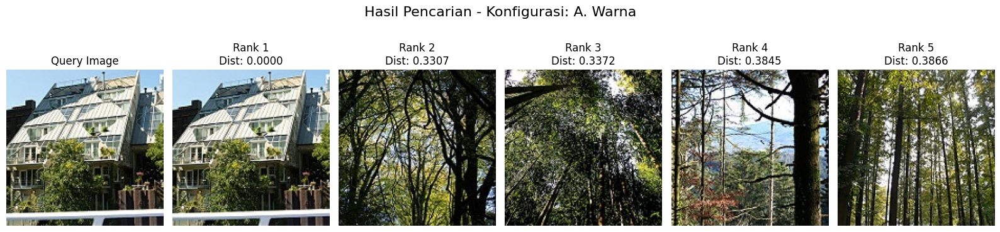

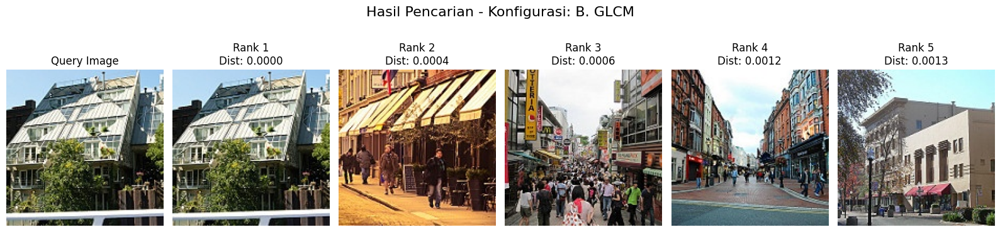

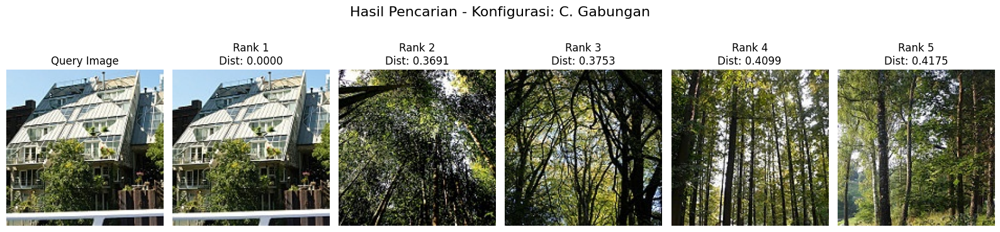

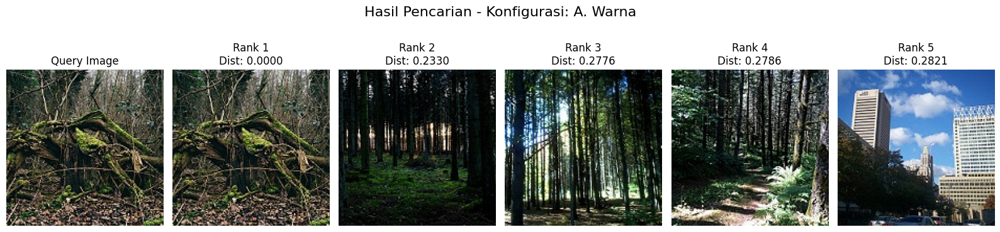

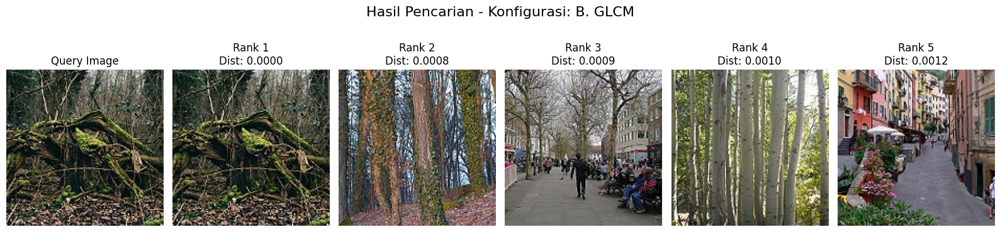

...

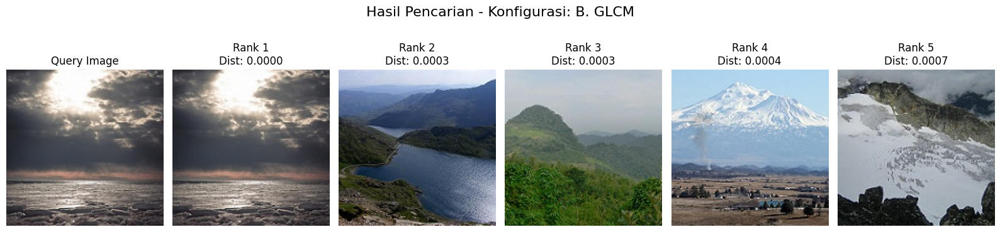

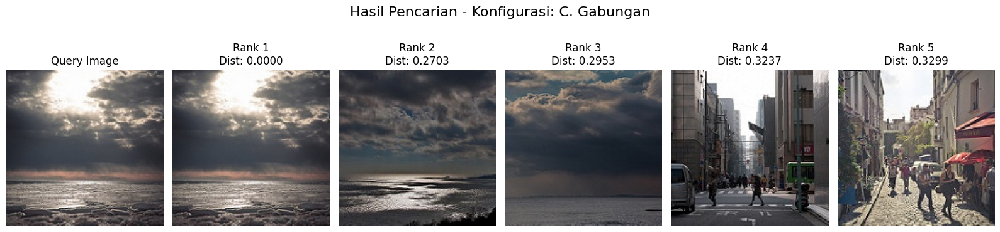

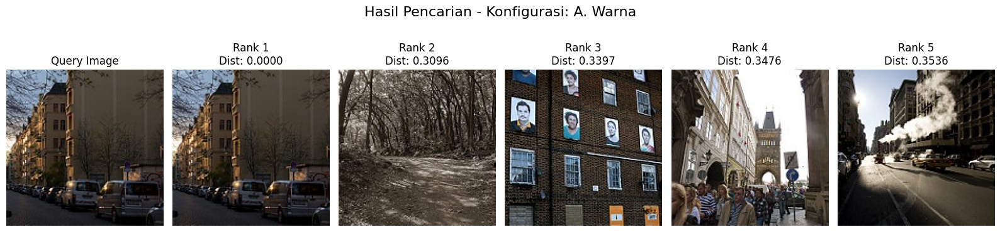

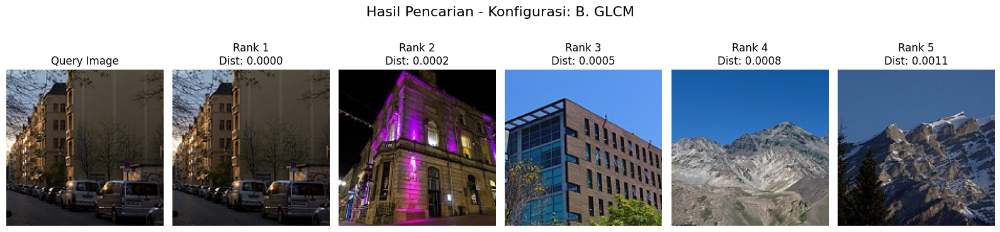

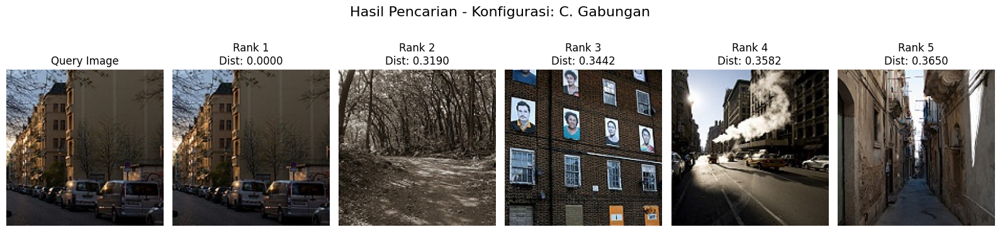

In [6]:
query_paths = iter_images("query")
assert len(query_paths) > 0, "Folder query/ kosong."

for qp in query_paths:
    qimg = imread_rgb(qp)

    resA = rank_topk(qimg, db_items, kind="color", metric="cosine", topk=5)
    resB = rank_topk(qimg, db_items, kind="glcm",  metric="cosine", topk=5)
    resC = rank_topk(qimg, db_items, kind="all",   metric="cosine", topk=5)

    show_topk(qimg, [(p,d) for (p,d,_) in resA], f"Hasil Pencarian - Konfigurasi: A. Warna")
    show_topk(qimg, [(p,d) for (p,d,_) in resB], f"Hasil Pencarian - Konfigurasi: B. GLCM")
    show_topk(qimg, [(p,d) for (p,d,_) in resC], f"Hasil Pencarian - Konfigurasi: C. Gabungan")

# EVALUASI

In [7]:
def precision_at_5_for_query(qpath, res):
    # label query diambil dari nama folder (jika ada), kalau tidak: "unknown"
    qlabel = get_label_from_path(qpath, root="query")
    if qlabel == "unknown":
        # fallback: jika struktur query tidak punya subfolder, coba infer dari nama file (opsional)
        pass
    match = sum(1 for (_,_,lab) in res if lab == qlabel)
    return match / 5.0, qlabel

def evaluate_p_at_5(items, metric="cosine"):
    qpaths = iter_images("query")
    confs = {"A(color)": "color", "B(GLCM)": "glcm", "C(all)": "all"}
    scores = {k: [] for k in confs}
    details = []

    for qp in qpaths:
        qimg = imread_rgb(qp)
        for cname, kind in confs.items():
            res = rank_topk(qimg, items, kind=kind, metric=metric, topk=5)
            p5, qlabel = precision_at_5_for_query(qp, res)
            scores[cname].append(p5)
        details.append((qp, qlabel))

    print("Precision@5 (rata-rata):")
    for cname in confs:
        arr = np.array(scores[cname], dtype=np.float64)
        print(f"  {cname}: {arr.mean():.3f}  (n={len(arr)})")

evaluate_p_at_5(db_items, metric="cosine")

Precision@5 (rata-rata):
  A(color): 0.433  (n=6)
  B(GLCM): 0.367  (n=6)
  C(all): 0.467  (n=6)
